In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [2]:
data = pd.read_excel("D:/Project SIP Exabyte/West Bengal/WB_Final(Daily-2013 to 2024).xlsx")

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4048 entries, 0 to 4047
Data columns (total 5 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date       4048 non-null   datetime64[ns]
 1   temp       4048 non-null   float64       
 2   humidity   4048 non-null   float64       
 3   cpi        4048 non-null   float64       
 4   peak_load  4048 non-null   float64       
dtypes: datetime64[ns](1), float64(4)
memory usage: 158.3 KB


In [4]:
df = data[['date','peak_load']]

In [5]:
df.head()

,date,peak_load
0,2013-04-01,6163.0
1,2013-04-02,6473.0
2,2013-04-03,6471.0
3,2013-04-04,6553.0
4,2013-04-05,6663.0


<Axes: xlabel='date'>

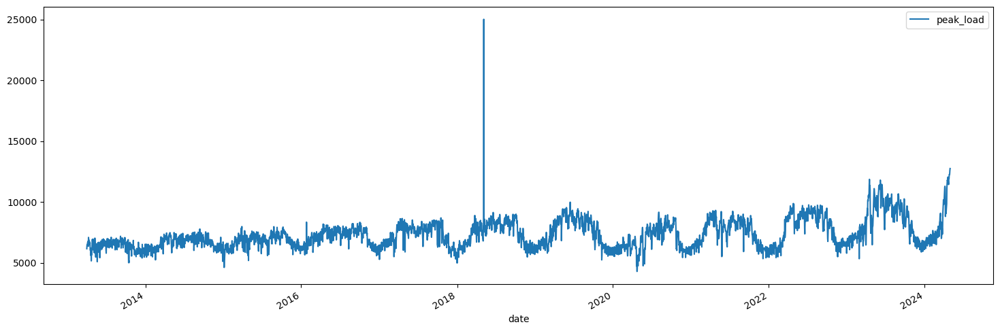

In [6]:
df.plot(x='date',y='peak_load',figsize=(18,6))

In [7]:
# Rename the columns to fit Prophet's requirements
df = df.rename(columns={'date': 'ds', 'peak_load': 'y'})


In [8]:
df.columns

Index(['ds', 'y'], dtype='object')

In [9]:
!pip install pandas prophet scikit-learn matplotlib

from prophet import Prophet
from prophet.plot import add_changepoints_to_plot,plot_plotly,plot_components_plotly

Defaulting to user installation because normal site-packages is not writeable


In [10]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(df, test_size=0.2, shuffle=False)


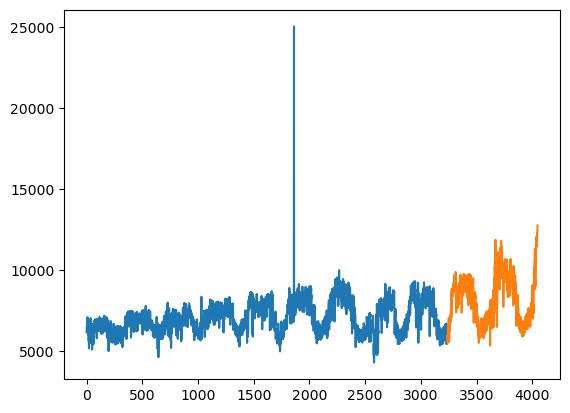

In [11]:
plt.plot(train['y'])
plt.plot(test['y'])

In [12]:
model = Prophet()
model.fit(train)

09:25:47 - cmdstanpy - INFO - Chain [1] start processing
09:25:49 - cmdstanpy - INFO - Chain [1] done processing


In [13]:
model.component_modes

{'additive': ['yearly',
  'weekly',
  'additive_terms',
  'extra_regressors_additive',
  'holidays'],
 'multiplicative': ['multiplicative_terms', 'extra_regressors_multiplicative']}

In [14]:
future = model.make_future_dataframe(periods=len(test), freq='D')

In [15]:
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower',
          'yhat_upper', 'trend',
          'trend_lower', 'trend_upper']].tail()


,ds,yhat,yhat_lower,yhat_upper,trend,trend_lower,trend_upper
4042,2024-04-26,9068.050840,6425.597173,11405.052846,8664.391987,6293.824808,10814.447559
4043,2024-04-27,9037.737265,6411.395865,11372.311719,8665.616938,6291.243600,10820.597047
4044,2024-04-28,8957.873052,6498.127171,11339.300294,8666.841889,6288.662392,10827.311129
4045,2024-04-29,8697.280588,6168.588651,11086.190684,8668.066839,6286.288569,10832.803428
4046,2024-04-30,9005.501337,6467.875878,11314.714290,8669.291790,6283.140225,10838.295727


In [16]:
forecast = model.predict(future)
# Extract only the predictions for the test period
forecast_test = forecast[['ds', 'yhat']].iloc[-len(test):].reset_index(drop=True)
test = test.reset_index(drop=True)



In [17]:
# Combine the actual values and predicted values
results = pd.concat([test, forecast_test['yhat']], axis=1)
results = results.rename(columns={'yhat': 'predicted'})


## Accuracy Metrics

In [18]:
# Calculate accuracy metrics
from sklearn.metrics import mean_absolute_error, mean_squared_error, mean_absolute_percentage_error
mae = mean_absolute_error(results['y'], results['predicted'])
mse = mean_squared_error(results['y'], results['predicted'])
rmse = np.sqrt(mse)

mape = mean_absolute_percentage_error(results['y'], results['predicted'])
print(f'MAE: {mae}')
print(f'MSE: {mse}')
print(f'RMSE: {rmse}')
print(f'MAPE: {mape * 100}%')  # Convert MAPE to percentage
print(f'Accuracy: {100 - (mape *100)}%')


MAE: 818.9468607623771
MSE: 1080329.023113746
RMSE: 1039.3887738059066
MAPE: 9.655876635935833%
Accuracy: 90.34412336406416%


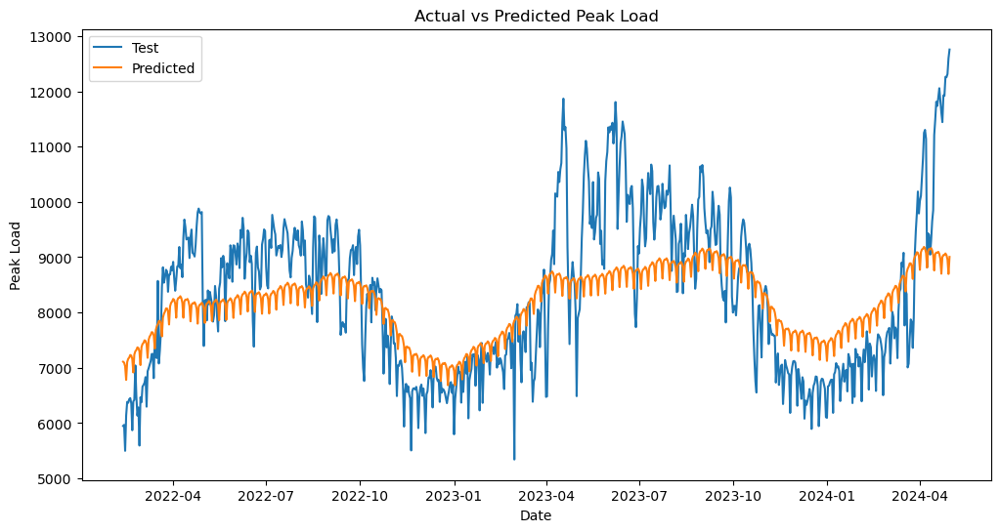

In [19]:
# Plot the results
plt.figure(figsize=(12, 6))
plt.plot(results['ds'], results['y'], label='Test')
plt.plot(results['ds'], results['predicted'], label='Predicted')
plt.xlabel('Date')
plt.ylabel('Peak Load')
plt.title('Actual vs Predicted Peak Load')
plt.legend()
plt.show()

In [20]:
plot_plotly(model ,forecast)

In [21]:
plot_components_plotly(model, forecast)

## Forecasting of Unknown Peak Load based on Training data and Forecasted for period upto  2025

In [22]:
train.tail()

,ds,y
3233,2022-02-06,5502.0
3234,2022-02-07,6115.0
3235,2022-02-08,6253.0
3236,2022-02-09,5981.0
3237,2022-02-10,5914.0


In [23]:
model = Prophet()
model.fit(train)

09:25:57 - cmdstanpy - INFO - Chain [1] start processing
09:26:00 - cmdstanpy - INFO - Chain [1] done processing


In [24]:
future_unknown = model.make_future_dataframe(periods=365 * 3 ,
                                            freq='D')



In [25]:
forecast_unknown = model.predict(future_unknown)
forecast_unknown[['ds', 'yhat', 'yhat_lower',
          'yhat_upper', 'trend',
          'trend_lower', 'trend_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper,trend,trend_lower,trend_upper
4327,2025-02-05,8357.225697,4435.937951,11608.023771,9013.502910,5135.760712,12012.838346
4328,2025-02-06,8369.486762,4453.083200,11548.041891,9014.727860,5129.831782,12017.914270
4329,2025-02-07,8406.567500,4490.988240,11590.816602,9015.952811,5123.902852,12022.990193
4330,2025-02-08,8386.085385,4480.915460,11496.931321,9017.177761,5118.051350,12028.066117
4331,2025-02-09,8316.207803,4442.068727,11461.468647,9018.402712,5112.618785,12032.410668


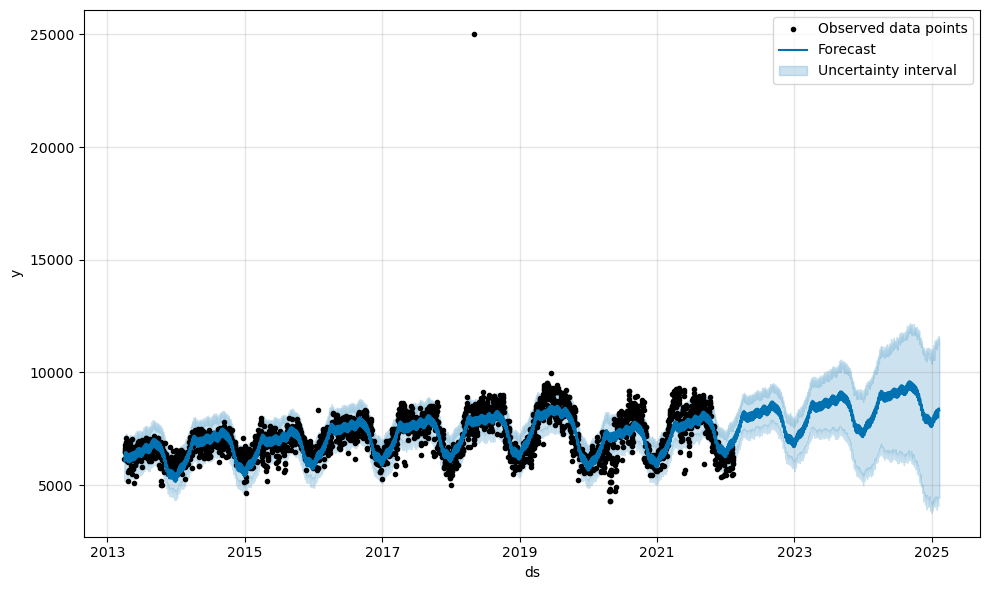

In [26]:
fig1 = model.plot(forecast_unknown, include_legend=True)

In [27]:
plot_plotly(model ,forecast_unknown)

In [28]:
plot_components_plotly(model, forecast_unknown)

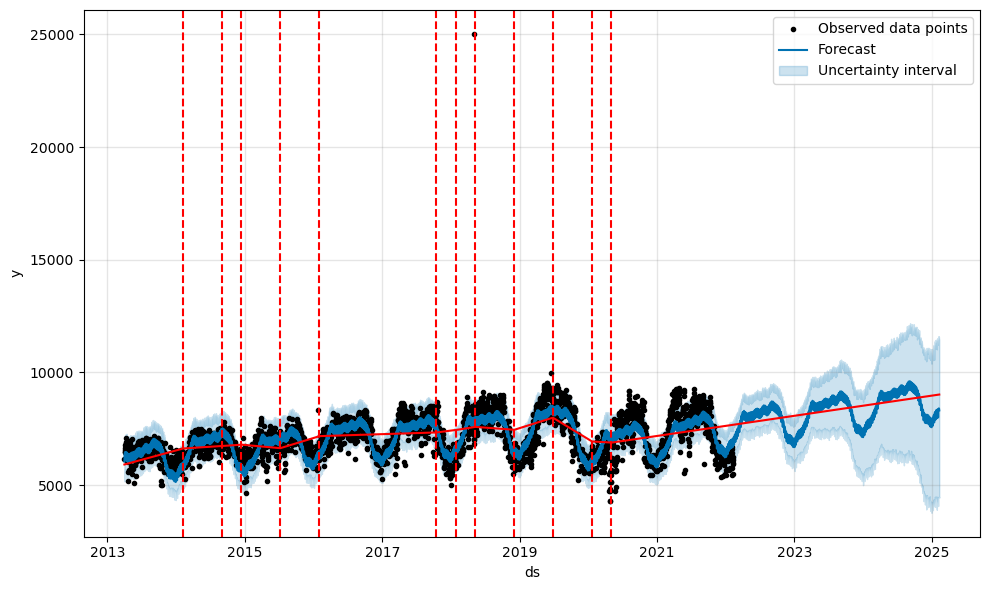

In [29]:
fig = model.plot(forecast_unknown,include_legend=True)
a = add_changepoints_to_plot(fig.gca(),
                             model, forecast_unknown)

## Add changepoints to indicate the time in rapid trend growths. The dotted red lines show the time when there was a rapid change in the trend of the Peak Load.